In [1]:

import pandas as pd
import numpy as np
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector
import matplotlib.patches as patches
from collections import Counter

In [2]:
df = pd.read_hdf("/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC3_2024-01-09T09_50_37DLC_resnet50_TMAZE DLC model May14shuffle1_300000_filtered.h5",)
print(df['DLC_resnet50_TMAZE DLC model May14shuffle1_300000'].columns)

MultiIndex([('righteye',          'x'),
            ('righteye',          'y'),
            ('righteye', 'likelihood'),
            ( 'lefteye',          'x'),
            ( 'lefteye',          'y'),
            ( 'lefteye', 'likelihood'),
            ('tailbase',          'x'),
            ('tailbase',          'y'),
            ('tailbase', 'likelihood')],
           names=['bodyparts', 'coords'])


In [3]:
# Create a dictionalsry to map body part names to coordinate columns
body_part_data = {}
unique_body_parts = df['DLC_resnet50_TMAZE DLC model May14shuffle1_300000'].columns.get_level_values(0).unique().tolist() 
try:
    unique_body_parts.remove('bodyparts')
except ValueError:
    pass
#df.clumns  retrieves all the columns from the excell sheet 
#get_level_values(0) --> the "0" means that it is only retriving the first level of the data which is the list of body parts 
#             (First level)     (second level)
# "MultiIndex([('bodyparts',     'coords'), --> first level is 
 #           ( 'righteye',          'x'),
  #          ( 'righteye',          'y'),
   #         ( 'righteye', 'likelihood'),
    #        (  'lefteye',          'x'),
     #       (  'lefteye',          'y'),
      #      (  'lefteye', 'likelihood'),
       #     ( 'tailbase',          'x'),
        #    ( 'tailbase',          'y'),
         #   ( 'tailbase', 'likelihood')],"
         #--> unique_body_parts = ['righteye','lefteye','tailbase']
for part in unique_body_parts:
    body_part_data[part] = {
        "x": df['DLC_resnet50_TMAZE DLC model May14shuffle1_300000'].loc[:, (part, 'x')].to_numpy(),
        "y": df['DLC_resnet50_TMAZE DLC model May14shuffle1_300000'].loc[:, (part, 'y')].to_numpy(),
        "likelihood": df['DLC_resnet50_TMAZE DLC model May14shuffle1_300000'].loc[:, (part, 'likelihood')].to_numpy()
    }

for part in body_part_data.keys():
    #print(f"body parts: {part}")
    print(part)
    
    


righteye
lefteye
tailbase


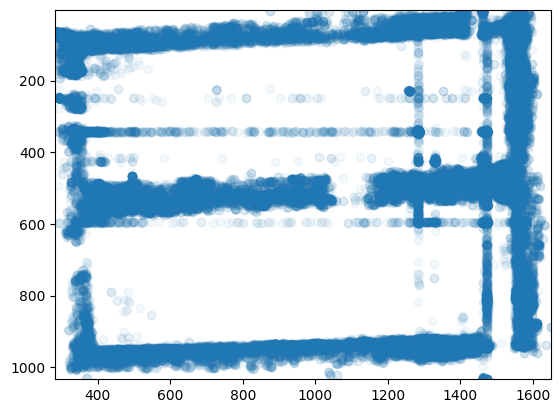

In [4]:
# Plot the data for the 'righteye' body part
fig, ax = plt.subplots()
righteye_x = body_part_data['righteye']['x']
righteye_y = body_part_data['righteye']['y']
ax.scatter(righteye_x, righteye_y, label='righteye', alpha = 0.05)

# Set the limits of the axes to fit the data
ax.set_xlim([min(righteye_x), max(righteye_x)])
ax.set_ylim([min(righteye_y), max(righteye_y)])

# Invert the y-axis
ax.invert_yaxis()

plt.show()

In [5]:






def click_event(event, x, y, flags, params): 
  
    # checking for left mouse clicks 
    if event == cv2.EVENT_LBUTTONDOWN: 
        coords.append([x,y])
        # displaying the coordinates 
        # on the Shell 
        print(x, ' ', y) 
  
        # displaying the coordinates 
        # on the image window 
        # font = cv2.FONT_HERSHEY_SIMPLEX 
        # cv2.putText(gray, str(x) + ',' +
        #             str(y), (x,y), font, 
        #             1, (255, 0, 0), 2) 
        cv2.imshow('image', gray)
  
    # checking for right mouse clicks      
    if event==cv2.EVENT_RBUTTONDOWN: 
  
        # displaying the coordinates 
        # on the Shell 
        print(x, ' ', y) 
  
        # displaying the coordinates 
        # on the image window 
        font = cv2.FONT_HERSHEY_SIMPLEX 
        b = gray[y, x, 0] 
        g = gray[y, x, 1] 
        r = gray[y, x, 2] 
        # cv2.putText(gray, str(b) + ',' +
        #             str(g) + ',' + str(r), 
        #             (x,y), font, 1, 
        #             (255, 255, 0), 2) 
        cv2.imshow('image', gray) 


In [7]:
import glob

folder = '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS'

listOfVideos = glob.glob(folder+'/*.mp4')

In [8]:
listOfVideos

['/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T15_25_35.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T15_50_51.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T16_32_53.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-25T16_36_03 (1).mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-25T16_56_44.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-25T17_15_36.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC3_2024-01-09T09_50_37.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC3_2024-01-09T15_31_38.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC3_2024-01-10T09_08_38.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC3_2024-01-18T18_00_07.mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC3_2024-01-19T13_06_09 (1).mp4',
 '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC3_2024

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# for video in listOfVideos:
vid = cv2.VideoCapture('/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-25T17_15_36.mp4') #video
while (True): 
    # Capture the video frame 
    # by frame 
    ret, frame = vid.read() 
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
      # Display the resulting frame 
    cv2.imshow('frame', frame) 
      

    if cv2.waitKey(1) & 0xFF == ord('q'): 
        break

coords = []
cv2.imshow('image', gray)
cv2.setMouseCallback('image', click_event) 
cv2.waitKey(0)
cv2.destroyAllWindows()

qt.qpa.plugin: Could not find the Qt platform plugin "wayland" in "/home/alan/.local/lib/python3.10/site-packages/cv2/qt/plugins"


252   323
258   401
973   397
968   319


In [10]:
coords 

[[252, 323], [258, 401], [973, 397], [968, 319]]

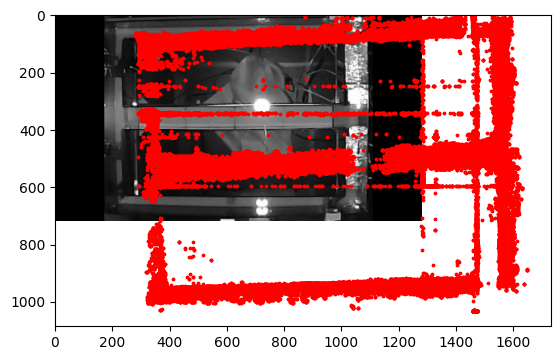

In [11]:


gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)



plt.imshow(gray,cmap='gray')


# plt.figure(figsize=(16,10))
x = np.array(body_part_data['righteye']['x'])
y = np.array(body_part_data['righteye']['y'])
plt.scatter(x,y,3,color='r')
plt.show()





In [12]:
body_part_data['righteye']['likelihood']

array([0.06358883, 0.04767784, 0.17996253, ..., 0.06319287, 0.06441891,
       0.05274417])

In [13]:
test = body_part_data['righteye']['x']#
test[body_part_data['righteye']['likelihood'] < 0.95] = np.nan

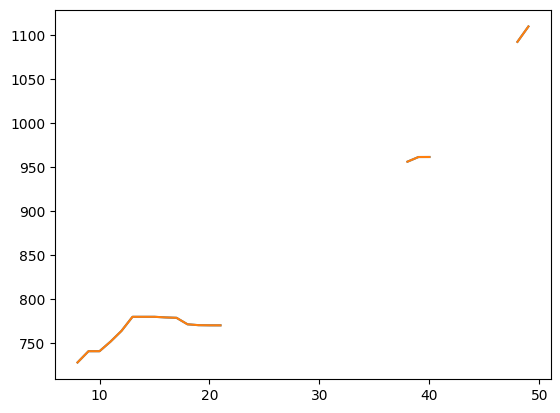

In [14]:
plt.plot(body_part_data['righteye']['x'][:50])
plt.plot(test[:50])

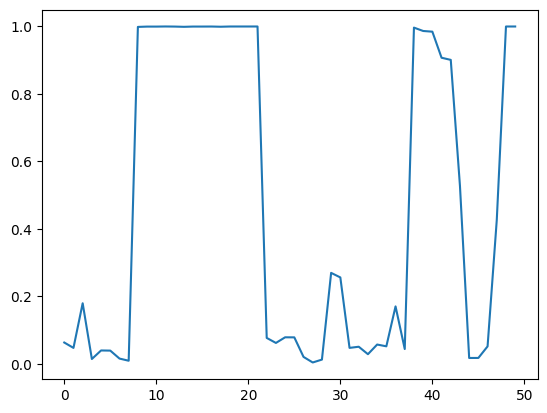

In [15]:
plt.plot(body_part_data['righteye']['likelihood'][:50])

In [ ]:
trial_starts = [50, 75, 80, 200, 2500] ## when the door opens
texture_contact_onset = [...] ## when the mouse crosses to the textured section


trial_ends = [55, 79, 88, 213, 2580] ## when the mouse chooses a port

: 

In [16]:


gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)



plt.imshow(gray,cmap='gray')


# plt.figure(figsize=(16,10))
x = np.array(body_part_data['righteye']['x'])[50:77]
y = np.array(body_part_data['righteye']['y'])[50:77]
plt.plot(x,y)
plt.show()





NameError: name 'img' is not defined

In [ ]:


gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)



plt.imshow(gray,cmap='gray')


# plt.figure(figsize=(16,10))
for trial in zip(trial_starts,trial_ends):


    x = np.array(body_part_data['righteye']['x'])[trial[0]:trial[1]]
    y = np.array(body_part_data['righteye']['y'])[trial[0]:trial[1]]
    plt.plot(x,y)
plt.show()




: 

Text(0.5, 1.0, 'Contours on Original Image')

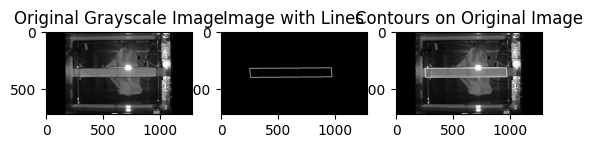

In [17]:
src = np.zeros(gray.shape, dtype=np.uint8)

for i in range(len(coords)):
    cv2.line(src, coords[i], coords[(i+1) % len(coords)], (255), 3)
contours, _ = cv2.findContours(src, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contour_img = gray.copy()
cv2.drawContours(contour_img, contours, -1, (255, 0, 0), 2)  # (255, 0, 0) is blue in BGR

# Plot the results
plt.subplot(1, 3, 1)
plt.imshow(gray, cmap='gray')
plt.title('Original Grayscale Image')

plt.subplot(1, 3, 2)
plt.imshow(src, cmap='gray')
plt.title('Image with Lines')

plt.subplot(1, 3, 3)
plt.imshow(contour_img, cmap='gray')
plt.title('Contours on Original Image')



In [44]:
## identify videos
folder = '/home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS'
listOfVideos = glob.glob(folder+'/*.mp4')



door_coords = {}


for video in listOfVideos[:10]:
    print('On video {}'.format(video))
    vid = cv2.VideoCapture(video) ##  video
    length = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))
    vid.set(cv2.CAP_PROP_POS_FRAMES, int(length/2)) ## set video to middle frame
    ret, frame = vid.read() ## read middle frame of video


    fg = frame[:60,:60] ## door size is about 60x60 pixels
    bg = frame ## middle frame of video
    bgCopy = bg.copy()
    move_rectangle = False
    BLUE = [255,0,0]
    RED = [0,0,255]

    initial_coords = {}
    initial_coords['door1'] = [220, 148]
    initial_coords['door2'] = [213, 448]
    initial_coords['door3'] = [929, 661]
    initial_coords['door4'] = [938, 46]

    final_coords = {}

    def mouse(event,x,y,flags,params):
        global move_rectangle, BLUE, fg, bg, bgCopy,final_coords, door
        #draw rectangle where x,y is rectangle center
        if event == cv2.EVENT_LBUTTONDOWN:
            move_rectangle = True

        elif event == cv2.EVENT_MOUSEMOVE:
            bg = bgCopy.copy() #!! your image is reinitialized with initial one
            if move_rectangle:
                cv2.rectangle(bg,(x-int(0.5*cols),y-int(0.5*rows)),
                (x+int(0.5*cols),y+int(0.5*rows)),BLUE, -1)

        elif event == cv2.EVENT_LBUTTONUP:
            move_rectangle = False
            cv2.rectangle(bg,(x-int(0.5*cols),y-int(0.5*rows)),
            (x+int(0.5*cols),y+int(0.5*rows)),BLUE, -1)
            final_coords[door] = [x,y]


    def draw_initial_coord(k):
        global bg, RED
        cv2.rectangle(bg,(initial_coords[k][0]-int(0.5*cols),initial_coords[k][1]-int(0.5*rows)),
        (initial_coords[k][0]+int(0.5*cols),initial_coords[k][1]+int(0.5*rows)),RED, -1)

    def set_final_coords(k,x,y):
        global final_coords
        final_coords[k] = [x,y]


    if __name__ == '__main__':
        rows, cols = fg.shape[:2]



        
        for door in initial_coords.keys():
            cv2.namedWindow('draw {}'.format(door))
            cv2.setMouseCallback('draw {}'.format(door), mouse)
            while True:
                cv2.imshow('draw {}'.format(door), bg)
                draw_initial_coord(door)
                k = cv2.waitKey(1)
                if k == 27 & 0xFF:
                    break
            cv2.destroyAllWindows()

    for door in initial_coords:
        try:
            print(door,final_coords[door])
        except KeyError:
            final_coords[door] = initial_coords[door] ## if the door was not moved, use the initial coordinates
            print(door,final_coords[door])
    door_coords[video] = final_coords

On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T15_25_35.mp4
door1 [220, 148]
door2 [213, 448]
door3 [929, 661]
door4 [938, 46]
On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T15_50_51.mp4
door1 [220, 148]
door2 [213, 448]
door3 [929, 661]
door4 [938, 46]
On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T16_32_53.mp4
door1 [220, 148]
door2 [213, 448]
door3 [929, 661]
door4 [938, 46]
On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-25T16_36_03 (1).mp4
door1 [220, 148]
door2 [213, 448]
door3 [929, 661]
door4 [938, 46]
On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-25T16_56_44.mp4
door1 [220, 148]
door2 [213, 448]
door3 [929, 661]
door4 [938, 46]
On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-25T17_15_36.mp4
door1 [220, 148]
door2 [213, 448]
door3 [929, 661]
door4 [938, 46]
On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS

KeyboardInterrupt: 

In [35]:
cv2.imshow('test',frame)#[148-30:148+30,220-30:220+30])

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob

## identify videos

for video in listOfVideos[:10]:
    print('On video {}'.format(video))
    vid = cv2.VideoCapture(video) ##  video
    ret, frame = vid.read() 
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    dc = door_coords[video]
    
    frameCounter = 0

    doorTraces = {}
    for door in range(4):
        doorkey = 'door{}'.format(door+1)
        doorTraces[doorkey] = []

    # Convert the first frame to grayscale
    gray1 = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    while True:
        # Read the next frame
        ret, frame2 = vid.read()
        if not ret:
            break

        # Convert the current frame to grayscale
        gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
        # Compute the absolute difference between the current frame and the previous frame
        diff = cv2.absdiff(gray1, gray2) 

        # Apply a threshold to get the binary image
        _, thresh = cv2.threshold(diff, 5, 255, cv2.THRESH_BINARY)
        
        
        doorImages = {}
        for door in range(4):
            doorkey = 'door{}'.format(door+1)
            doorImages[doorkey] = thresh[dc[doorkey][1]-30:dc[doorkey][1]+30, dc[doorkey][0]-30:dc[doorkey][0]+30]
        cv2.imshow('door1',doorImages['door1'])
        # Optional: Apply some morphological operations to reduce noise
        # kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        # thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

        # Highlight the motion areas in the original frame
        #motion_areas = cv2.bitwise_and(frame2, frame2, mask=thresh)

        # # Display the original frame and the thresholded difference
        # cv2.imshow('Original', frame2)
        # cv2.imshow('Motion Detection', motion_areas)
        
        
        
        for door in range(4):
            doorkey = 'door{}'.format(door+1)
            doorTraces[doorkey].append(np.sum(doorImages[doorkey]))
    

        # Update the previous frame
        gray1 = gray2
        frameCounter += 1
        
        if frameCounter % 200 == 0:
            print('On frame {}'.format(frameCounter))
        # Break the loop on 'q' key press
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    # Release the video capture object and close all OpenCV windows
    vid.release()
    cv2.destroyAllWindows()
    
    
    ### save doorTraces
    import pickle
    with open(video.split('.')[0]+'_doorTraces.pkl', 'wb') as f:
        pickle.dump(doorTraces, f, protocol=pickle.HIGHEST_PROTOCOL)


On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T15_25_35.mp4
On frame 200
On frame 400
On frame 600
On frame 800
On video /home/alan/teams/General/TMAZE/TMAZE_REFINED_VIDEOS/BDC32024-01-23T15_50_51.mp4
On frame 200
On frame 400


KeyboardInterrupt: 

In [36]:
cv2.destroyAllWindows()

In [137]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob

## identify videos
folder = r'C:\Users\ajemanu\Emory University\SOM Emanuel Lab - General\TMAZE\TMAZE_REFINED_VIDEOS'
listOfVideos = glob.glob(folder+'\\*.mp4')


drawing = False
ix,iy = -1,-1
coords = []
frameCounter = 0
def draw_rectangle(event, x, y, flags, param):
   global ix, iy, drawing, gray, coords
   if event == cv2.EVENT_LBUTTONDOWN:
      drawing = True
      ix = x
      iy = y
   elif event == cv2.EVENT_LBUTTONUP:
      drawing = False
      cv2.rectangle(gray, (ix, iy),(x, y),(0, 255, 255),-1)
      coords.append([ix, iy, x, y])

for video in listOfVideos[1:2]:
    print('On video {}'.format(video))
    vid = cv2.VideoCapture(video) ##  video
    ret, frame = vid.read() 
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    doorCoords = {}
    for door in range(4):
        windowName = 'Draw Door {}'.format(door)
        cv2.namedWindow(windowName)
        cv2.setMouseCallback(windowName,  draw_rectangle)

        while True:
            cv2.imshow(windowName, gray) 
            if cv2.waitKey(0):
                break
        cv2.destroyAllWindows()
        doorCoords[door] = coords[-1]


    doorTraces = {}
    for door in range(4):
        doorTraces[door] = []

    # Convert the first frame to grayscale
    gray1 = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    while True:
        # Read the next frame
        ret, frame2 = vid.read()
        if not ret:
            break

        # Convert the current frame to grayscale
        gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
        # Compute the absolute difference between the current frame and the previous frame
        diff = cv2.absdiff(gray1, gray2) 

        # Apply a threshold to get the binary image
        _, thresh = cv2.threshold(diff, 5, 255, cv2.THRESH_BINARY)
        
        
        doorImages = {}
        for door in range(4):
            doorImages[door] = thresh[doorCoords[door][1]:doorCoords[door][3], doorCoords[door][0]:doorCoords[door][2]]
            
        # Optional: Apply some morphological operations to reduce noise
        # kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        # thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

        # Highlight the motion areas in the original frame
        #motion_areas = cv2.bitwise_and(frame2, frame2, mask=thresh)

        # # Display the original frame and the thresholded difference
        # cv2.imshow('Original', frame2)
        # cv2.imshow('Motion Detection', motion_areas)
        
        
        
        for door in range(4):
            doorTraces[door].append(np.sum(doorImages[door]))
    

        # Update the previous frame
        gray1 = gray2
        frameCounter += 1
        
        if frameCounter % 200 == 0:
            print('On frame {}'.format(frameCounter))
        # Break the loop on 'q' key press
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    # Release the video capture object and close all OpenCV windows
    vid.release()
    cv2.destroyAllWindows()
    
    
    ### save doorTraces
    import pickle
    with open(video.split('.')[0]+'_doorTraces.pkl', 'wb') as f:
        pickle.dump(doorTraces, f, protocol=pickle.HIGHEST_PROTOCOL)


On video C:\Users\ajemanu\Emory University\SOM Emanuel Lab - General\TMAZE\TMAZE_REFINED_VIDEOS\BDC32024-01-23T15_50_51.mp4
On frame 200
On frame 400
On frame 600
On frame 800
On frame 1000
On frame 1200
On frame 1400
On frame 1600
On frame 1800
On frame 2000
On frame 2200
On frame 2400
On frame 2600
On frame 2800
On frame 3000
On frame 3200
On frame 3400
On frame 3600
On frame 3800
On frame 4000
On frame 4200
On frame 4400
On frame 4600
On frame 4800
On frame 5000
On frame 5200
On frame 5400
On frame 5600
On frame 5800
On frame 6000
On frame 6200
On frame 6400
On frame 6600
On frame 6800
On frame 7000
On frame 7200
On frame 7400
On frame 7600
On frame 7800
On frame 8000
On frame 8200
On frame 8400
On frame 8600
On frame 8800
On frame 9000
On frame 9200
On frame 9400
On frame 9600
On frame 9800
On frame 10000
On frame 10200
On frame 10400
On frame 10600
On frame 10800
On frame 11000
On frame 11200
On frame 11400
On frame 11600
On frame 11800
On frame 12000
On frame 12200
On frame 12400

[Text(0, 0, '0'),
 Text(100, 0, '100'),
 Text(200, 0, '200'),
 Text(300, 0, '300'),
 Text(400, 0, '400'),
 Text(500, 0, '500'),
 Text(600, 0, '600'),
 Text(700, 0, '700'),
 Text(800, 0, '800'),
 Text(900, 0, '900'),
 Text(1000, 0, '1000'),
 Text(1100, 0, '1100'),
 Text(1200, 0, '1200'),
 Text(1300, 0, '1300'),
 Text(1400, 0, '1400'),
 Text(1500, 0, '1500'),
 Text(1600, 0, '1600'),
 Text(1700, 0, '1700'),
 Text(1800, 0, '1800'),
 Text(1900, 0, '1900')]

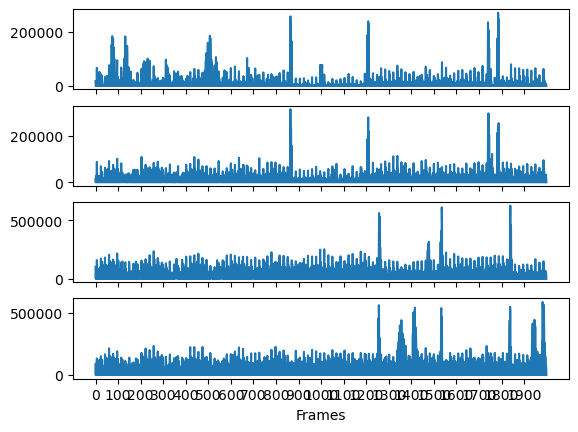

In [139]:
ind0, ind1 = 0, 2000


f, ax = plt.subplots(4,1)
ax[0].plot(doorTraces[0][ind0:ind1])
ax[1].plot(doorTraces[1][ind0:ind1])
ax[2].plot(doorTraces[2][ind0:ind1])
ax[3].plot(doorTraces[3][ind0:ind1])

for a in range(3):
    ax[a].set_xticklabels([])
    ax[a].set_xticks(np.arange(ind0-ind0, ind1-ind0, 100))
ax[3].set_xlabel('Frames')
ax[3].set_xticks(np.arange(ind0-ind0, ind1-ind0, 100))
ax[3].set_xticklabels(np.arange(ind0, ind1, 100))


In [69]:
ax

0

In [140]:
door1 = np.array(doorTraces[0]) > 200000
door2 = np.array(doorTraces[1]) > 200000
door3 = np.array(doorTraces[2]) > 400000
door4 = np.array(doorTraces[3]) > 400000

In [141]:
door1_filtered = np.zeros(len(door1),dtype=bool)
for n in range(len(door1)):
    try:
        if door1[n+1] or door1[n]:
            door1_filtered[n:n+2] = True
    except:
        pass
        
door2_filtered = np.zeros(len(door2),dtype=bool)
for n in range(len(door2)):
    try:
        if door2[n+1] or door2[n]:
            door2_filtered[n:n+2] = True
    except:
        pass

door3_filtered = np.zeros(len(door3),dtype=bool)
for n in range(len(door3)):
    try:
        if door3[n+1] or door3[n]:
            door3_filtered[n:n+2] = True
    except:
        pass

door4_filtered = np.zeros(len(door4),dtype=bool)
for n in range(len(door4)):
    try:
        if door4[n+1] or door4[n]:
            door4_filtered[n:n+2] = True
    except:
        pass

In [142]:
door1_filtered

array([False, False, False, ..., False, False, False])

In [143]:
bothDoorsChanging12 = np.bitwise_and(door1_filtered,door2_filtered)
bothDoorsChanging34 = np.bitwise_and(door3_filtered,door4_filtered)

In [144]:
doors12_change_frame = np.where(bothDoorsChanging12[1:] > bothDoorsChanging12[:-1])[0]
doors34_change_frame = np.where(bothDoorsChanging34[1:] > bothDoorsChanging34[:-1])[0]

In [147]:
doors34_change_frame.shape

(200,)

In [148]:
print(doors12_change_frame.shape,doors34_change_frame.shape)

(200,) (200,)


In [149]:
doors12_open_frame = doors12_change_frame[::2]
doors12_close_frame = doors12_change_frame[1::2]
doors34_open_frame = doors34_change_frame[::2]
doors34_close_frame = doors34_change_frame[1::2]

In [150]:
trial_starts = doors12_open_frame
trial_ends = doors34_open_frame

Text(0.5, 0, 'Trial Duration (s)')

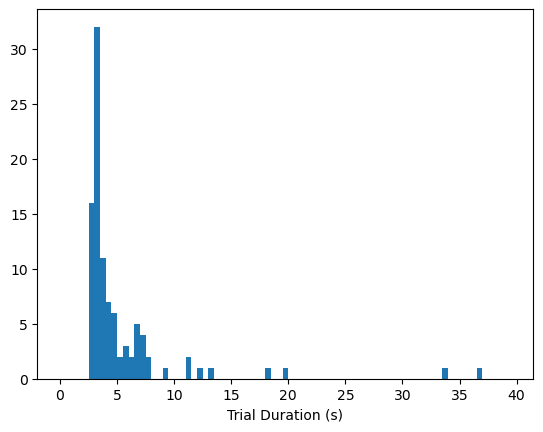

In [157]:
plt.hist(trial_ends/30 - trial_starts/30,np.arange(0,40,0.5))

plt.xlabel('Trial Duration (s)')

In [161]:
dlc_dict = pd.read_hdf(r"C:\Users\ajemanu\Emory University\SOM Emanuel Lab - General\TMAZE\TMAZE_REFINED_VIDEOS\BDC32024-01-23T15_50_51DLC_resnet50_TMAZE DLC model May14shuffle1_300000_filtered.h5")

In [208]:
righteye = dlc_dict['DLC_resnet50_TMAZE DLC model May14shuffle1_300000']['righteye']
lefteye = dlc_dict['DLC_resnet50_TMAZE DLC model May14shuffle1_300000']['lefteye']
tailbase = dlc_dict['DLC_resnet50_TMAZE DLC model May14shuffle1_300000']['tailbase']

righteye_filtered = np.copy(righteye)
righteye_filtered[righteye['likelihood'] < 0.15] = np.nan

lefteye_filtered = np.copy(lefteye)
lefteye_filtered[lefteye['likelihood'] < 0.15] = np.nan

tailbase_filtered = np.copy(tailbase)
tailbase_filtered[tailbase['likelihood'] < 0.15] = np.nan

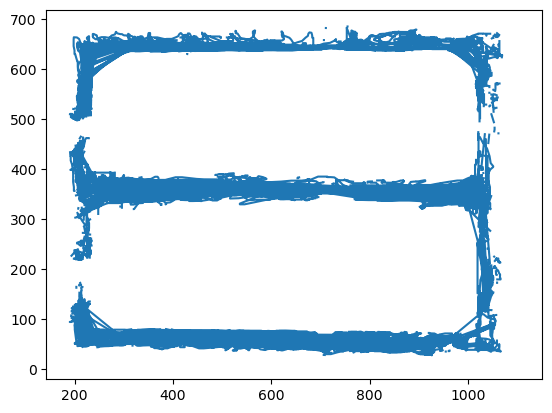

In [209]:
plt.plot(righteye_filtered[:,0],righteye_filtered[:,1])

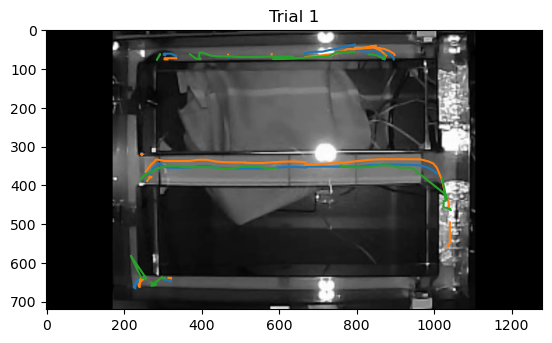

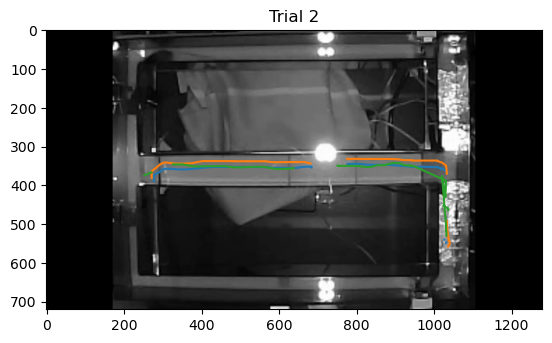

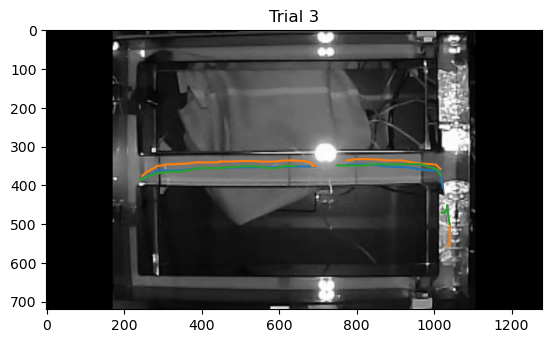

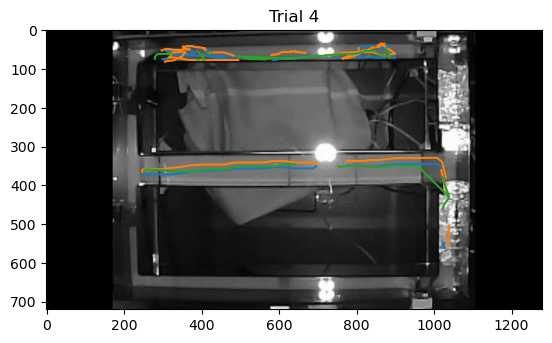

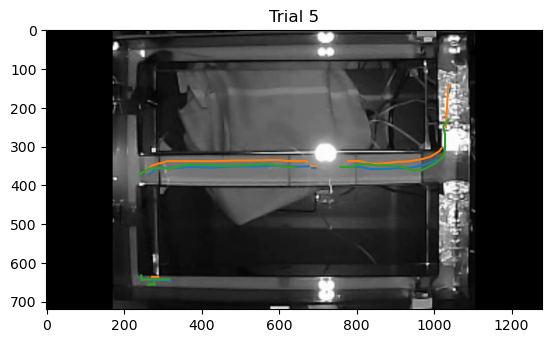

...

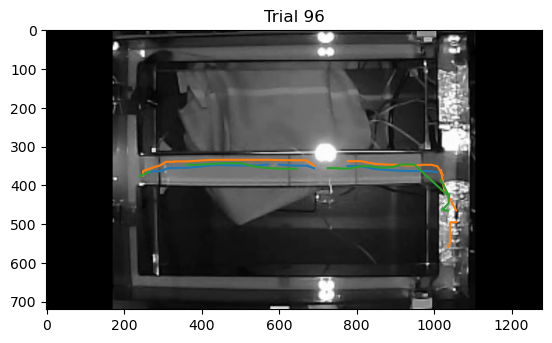

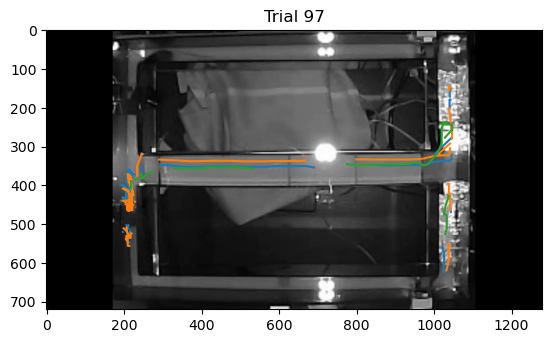

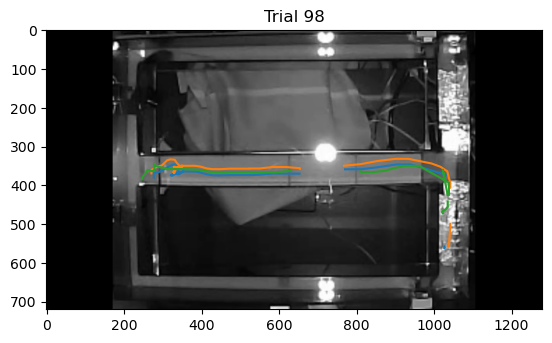

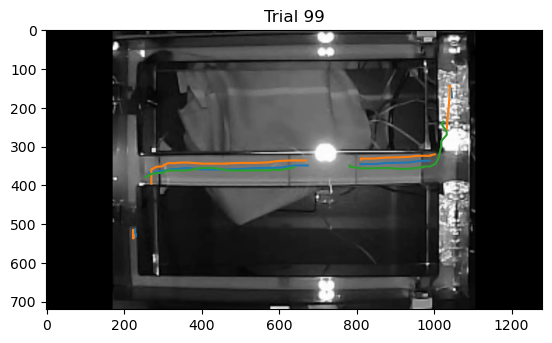

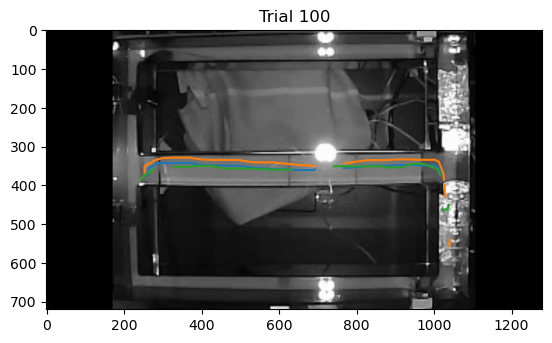

In [210]:
for trial in range(100):
    plt.figure()
    plt.imshow(frame,cmap='gray')
    plt.plot(righteye_filtered[trial_starts[trial]:trial_ends[trial],0],righteye_filtered[trial_starts[trial]:trial_ends[trial],1])
    plt.plot(lefteye_filtered[trial_starts[trial]:trial_ends[trial],0],lefteye_filtered[trial_starts[trial]:trial_ends[trial],1])
    plt.plot(tailbase_filtered[trial_starts[trial]:trial_ends[trial],0],tailbase_filtered[trial_starts[trial]:trial_ends[trial],1])
    plt.title('Trial {}'.format(trial+1))
    plt.show()
    plt.close()


In [215]:
trial_starts[84]/30/60, trial_ends[84]/30/60

(32.00888888888889, 34.867222222222225)